In [2]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/15633.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/12070.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/14644.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/11624.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/15278.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/15765.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/10438.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/10298.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/14912.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/10363.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/Ischemia/DICOM/10499.dcm
/kaggle/input/brain-stroke-ct-dataset/Brain

In [3]:
import torch
import torchvision
import torch.nn as nn
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor,Normalize,Compose
from torch.utils.data import DataLoader,Subset
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import Image,FileLink
from torchvision.utils import save_image
import cv2
import numpy as np


In [6]:
from torchvision import transforms

transformer = transforms.Compose([
    transforms.Resize((240, 320)),  # Resize to H=240, W=320
    transforms.ToTensor()
])

In [11]:

data_dir='/kaggle/input/brain-stroke-ct-dataset/Brain_Stroke_CT_Dataset/'
dataset=ImageFolder(data_dir+'/',transform=transformer)




#print("dataset: ",len(dataset))
# Get used class indices in the subset
#used_class_indices = set(n_dataset[i][1] for i in keep_indices)

# Map them back to class names
#used_class_names = [n_dataset.classes[i] for i in sorted(used_class_indices)]



In [12]:
index=np.random.randint(0,len(dataset)-1)
img,label=dataset[0]
print('label: ',label)
print(img[:,10:15,10:15])
torch.min(img),torch.max(img)

label:  0
tensor([[[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]]])


(tensor(0.), tensor(1.))

In [13]:
def denorm(x):
  out=(x+1)/2
  return out.clamp(0,1)

label 0


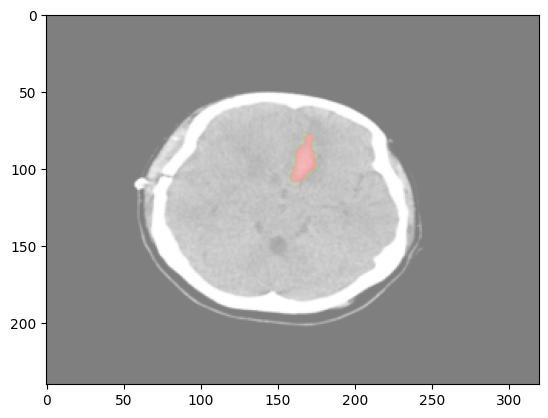

In [14]:
%matplotlib inline

img_norm=denorm(img)
plt.imshow(img_norm.permute(1,2,0))##plt.imshow(img_norm[0],cmap='gray')
print("label",label)

9473
149
img batch shape torch.Size([64, 3, 240, 320])
label batch shape tensor([3, 3, 3, 3, 3, 0, 0, 2, 2, 3, 1, 0, 2, 3, 3, 2, 0, 2, 1, 3, 3, 3, 3, 0,
        1, 0, 3, 3, 3, 3, 1, 0, 0, 3, 3, 2, 1, 2, 1, 2, 0, 3, 2, 3, 3, 2, 3, 3,
        3, 0, 2, 0, 2, 2, 1, 3, 3, 3, 3, 3, 3, 0, 2, 1])


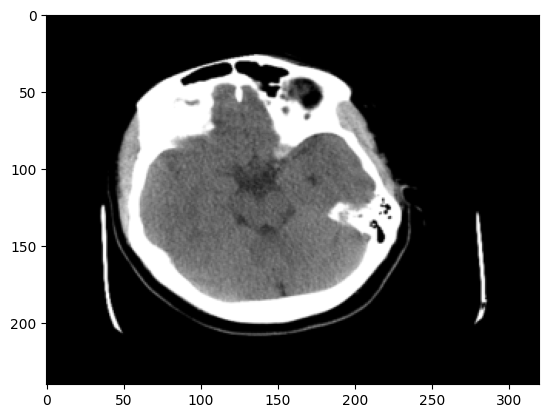

In [15]:
batch_size=64
print(len(dataset))
data_loader=DataLoader(dataset,batch_size=batch_size,shuffle=True)
print(len(data_loader))
for img_batch,label_batch in data_loader:
  print('img batch shape',img_batch.shape)
  plt.imshow(img_batch[0][0],cmap='gray')
  print('label batch shape',label_batch)
  break

In [16]:
device=torch.device('cuda' if  torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [17]:
#batch_size = 64
latent_size = 4
image_size = 230400  # 3*240*320
hidden_size = 20
D=nn.Sequential(
    nn.Linear(image_size,hidden_size),
    nn.LeakyReLU(0.1),
    nn.Linear(hidden_size,hidden_size),
    nn.LeakyReLU(0.1),
    nn.Linear(hidden_size,1),
    nn.Sigmoid()
).to(device)##D for Discriminator


In [18]:
G=nn.Sequential(
    nn.Linear(latent_size,12),
    nn.ReLU(),
    nn.Linear(12,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,50),
    nn.ReLU(),
    nn.Linear(50,550),
    nn.ReLU(),
    nn.Linear(550,image_size),
    nn.Tanh()
).to(device)##G for Generator

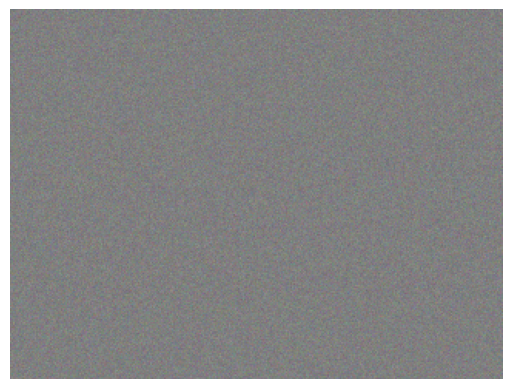

In [19]:


y = G(torch.randn(1, latent_size).to(device))
gen_imgs = denorm(y.view(1, 3, 240, 320)).detach().cpu()
plt.imshow(gen_imgs[0].permute(1, 2, 0))
plt.axis('off')
plt.show()


In [26]:
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.006)
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.006)
#def reset_grad():
  #g_optimizer.zero_grad()
  ##Discriminator training
def train_discriminator(images):
  images = images.to(device)  
  real_labels = torch.ones(images.size(0), 1).to(device)
  fake_labels = torch.zeros(images.size(0), 1).to(device)
                                                  
  outputs=D(images)
  d_loss_real=criterion(outputs,real_labels)
  real_score=outputs
    
  z = torch.randn(images.size(0), latent_size).to(device)
  fake_images=G(z)
  outputs=D(fake_images.detach())
  d_loss_fake=criterion(outputs,fake_labels)
  fake_score=outputs
  
  d_loss=d_loss_real+d_loss_fake
  d_optimizer.zero_grad()
  d_loss.backward()
  d_optimizer.step()
  return d_loss,real_score,fake_score

In [21]:
#Generator training
def train_generator(images):
  z=torch.randn(batch_size,latent_size).to(device)
  fake_images=G(z)
  #d_loss_fake=criterion(outputs,fake_labels)
  labels=torch.ones(batch_size,1).to(device)
  outputs = D(fake_images)
  g_loss=criterion(outputs,labels)
  g_optimizer.zero_grad()
  g_loss.backward()
  g_optimizer.step()
  return g_loss,fake_images

In [22]:
sample_dir='samples'
if not os.path.exists(sample_dir):
    os.makedirs(sample_dir)

sample_dir2='samples2'
if not os.path.exists(sample_dir2):
    os.makedirs(sample_dir2)

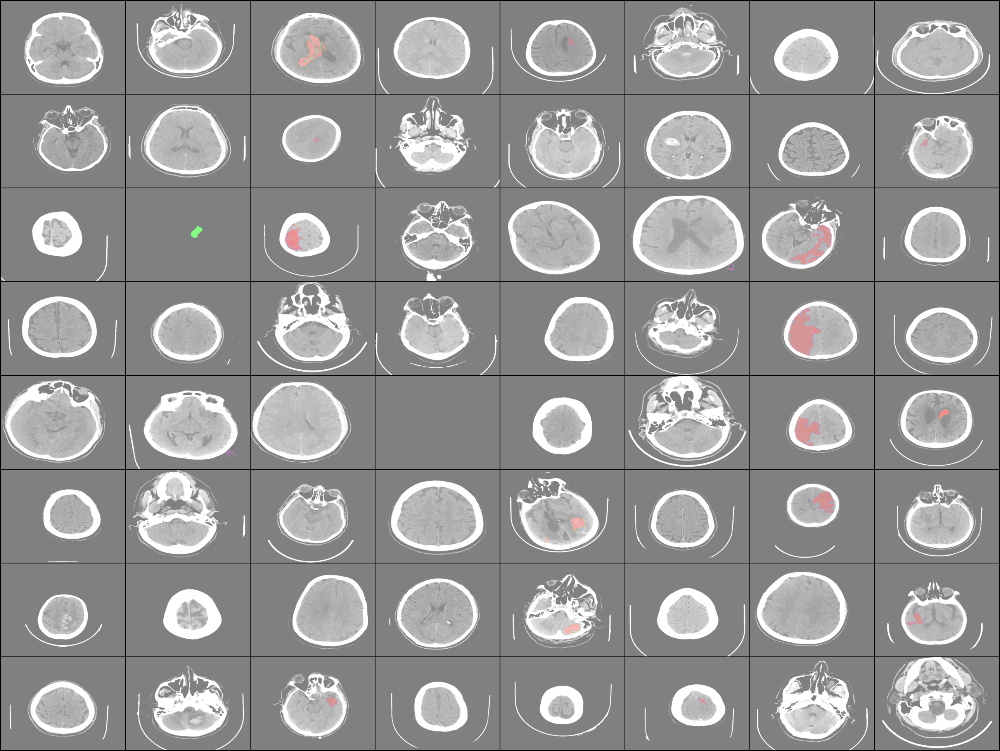

In [23]:
for images, _ in data_loader:
  #images=images.reshape(images.size(),3,240,320)
  #print(images.shape)
  save_image(denorm(images),os.path.join(sample_dir,'real_images.png'),nrow=8)
  break
Image(os.path.join(sample_dir,'real_images.png'))

Saving fake_images-0000.png


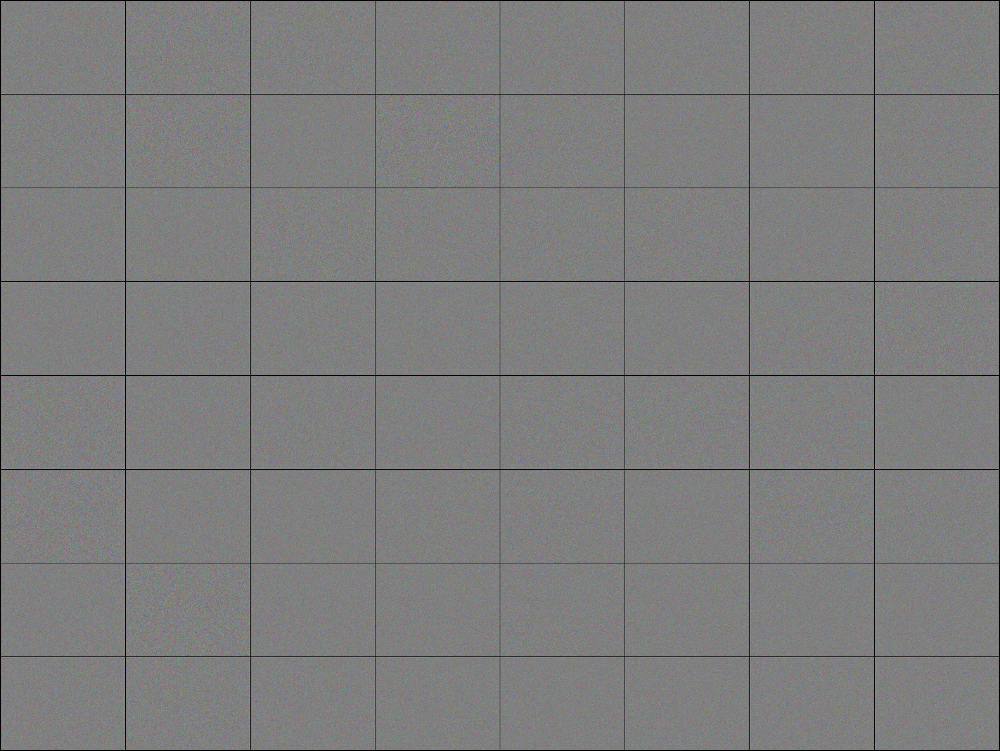

In [24]:
sample_vectors= torch.randn(batch_size,latent_size).to(device)
def save_fake_images(index):
  fake_images=G(sample_vectors)
  fake_images=fake_images.reshape(fake_images.size(0),3,240,320)
  fake_f_name='fake_images-{0:0=4d}.png'.format(index)
  print('Saving',fake_f_name)
  save_image(denorm(fake_images),os.path.join(sample_dir2,fake_f_name),nrow=8)
save_fake_images(0)
Image(os.path.join(sample_dir2,'fake_images-0000.png'))

In [ ]:
num_epoch=15
total_step=len(data_loader)
d_losses,g_losses,real_scores,fake_scores=[],[],[],[]


for epoch in range(num_epoch):
  for i,(images,_) in enumerate(data_loader):
      images = images.to(device)  # shape: [B, 3, 240, 320]
      images = images.view(images.size(0), -1) 
      d_loss,real_score,fake_score=train_discriminator(images)
      g_loss,fake_images=train_generator(images)
      if(i+1)%5==0:
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())
        real_scores.append(real_score.mean().item())
        fake_scores.append(fake_score.mean().item())
        print(f'Epoch [{epoch+1}/{num_epoch}], Step [{i+1}/{total_step}], '
      f'd_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}, '
      f'D(x): {real_score.mean().item():.2f}, D(G(z)): {fake_score.mean().item():.2f}')  
  save_fake_images(epoch+1)

Epoch [1/15], Step [5/149], d_loss: 97.3476, g_loss: 100.0000, D(x): 0.00, D(G(z)): 0.00
Epoch [1/15], Step [10/149], d_loss: 98.6232, g_loss: 100.0000, D(x): 0.00, D(G(z)): 0.00
Epoch [1/15], Step [15/149], d_loss: 97.9967, g_loss: 100.0000, D(x): 0.01, D(G(z)): 0.00
Epoch [1/15], Step [20/149], d_loss: 0.0091, g_loss: 100.0000, D(x): 0.99, D(G(z)): 0.00
Epoch [1/15], Step [25/149], d_loss: 0.0091, g_loss: 100.0000, D(x): 0.99, D(G(z)): 0.00
Epoch [1/15], Step [30/149], d_loss: 0.0096, g_loss: 100.0000, D(x): 0.99, D(G(z)): 0.00
Epoch [1/15], Step [35/149], d_loss: 0.0086, g_loss: 100.0000, D(x): 0.99, D(G(z)): 0.00
Epoch [1/15], Step [40/149], d_loss: 0.0000, g_loss: 100.0000, D(x): 1.00, D(G(z)): 0.00
Epoch [1/15], Step [45/149], d_loss: 0.0000, g_loss: 100.0000, D(x): 1.00, D(G(z)): 0.00
Epoch [1/15], Step [50/149], d_loss: 0.0084, g_loss: 100.0000, D(x): 0.99, D(G(z)): 0.00
